In [1]:
# ライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import gym
from gym import spaces

# gym.Envを継承したEasyMazeクラス
class EasyMaze(gym.Env):
    # この環境ではrenderのモードとしてrgb_arrayのみを用意していることを宣言しておく
    # GymのWrapperなどから参照される可能性がある
    metadata = {'render.modes': ['rgb_array']}

    m = 0.2 # 迷路の周りの外枠の幅
    c = 1   # 各セルの幅

    agent_color = "blue"      # エージェントの色
    maze_color = "green"      # 迷路の色

    # 迷路の枠の描画関連情報
    maze_info_rec = {"xy":[(0, 0), (0, m+4*c), (m+4*c, 0), (0, 0),
                            (m, m+c), (m+c, m+3*c), (m+3*c, m+c)], 
                    "width":[m, 2*m+4*c, m, 2*m+4*c,
                                2*c, c, c], 
                    "height":[2*m+4*c, m, 2*m+4*c, m,
                                c, c, c]}

    # 迷路内の点線の表示関連情報
    maze_info_line = {"s_xy":[(m, m+c), (m, m+2*c), (m, m+3*c),
                            (m+c, m), (m+2*c, m), (m+3*c, m)], 
                    "e_xy":[(m+4*c, m+c), (m+4*c, m+2*c), (m+4*c, m+3*c),
                            (m+c, m+4*c), (m+2*c, m+4*c), (m+3*c, m+4*c)]}

    # 状態テキストの表示位置情報
    maze_state_pos = {"xy":[(m+0.5*c, m+3.5*c), (m+0.5*c, m+2.5*c), (m+1.5*c, m+2.5*c),
                            (m+2.5*c, m+2.5*c), (m+2.5*c, m+3.5*c), (m+3.5*c, m+3.5*c),
                            (m+3.5*c, m+2.5*c), (m+2.5*c, m+1.5*c), (m+2.5*c, m+0.5*c),
                            (m+3.5*c, m+0.5*c), (m+1.5*c, m+0.5*c), (m+0.5*c, m+0.5*c),], 
                        "text":["s0", "s1", "s2", "s3", "s4", "s5", "s6", 
                                "s7", "s8", "s9", "s10", "s11"]}
    
    # 状態と行動に対する遷移先状態(ダイナミクス)
    # 一般的にMDPにおけるダイナミクスは確率P(s'|s,a)で表されるが、ここでは決定論的なダイナミクスを採用
    # 左から順番に行動入力が"left"，"top"，"right"，"down"の場合の各状態の遷移先を示す
    # 例）状態"s0"のとき、
    #          "left"を受け取っても移動ができないので遷移先は現在と同じ"s0"
    #          "top"を受け取っても移動ができないので遷移先は現在と同じ"s0"
    #          "right"を受け取っても移動ができないので遷移先は現在と同じ"s0"
    #          "down"を受け取ったら下へ移動できるので遷移先は"s1"
    # その他全ての状態も同様
    dynamics = {"s0":["s0", "s0", "s0", "s1"],
                "s1":["s1", "s0", "s2", "s1"],
                "s2":["s1", "s2", "s3", "s2"],
                "s3":["s2", "s4", "s6", "s7"],
                "s4":["s4", "s4", "s5", "s3"],
                "s5":["s4", "s5", "s5", "s6"],
                "s6":["s3", "s5", "s6", "s6"],
                "s7":["s7", "s3", "s7", "s8"],
                "s8":["s10", "s7", "s9", "s8"],
                "s9":["s8", "s9", "s9", "s9"],
                "s10":["s11", "s10", "s8", "s10"],
                "s11":["s11", "s11", "s10", "s11"]}
    
    def __init__(self):
        super(EasyMaze, self).__init__()

        self.fig = None
        self.ax = None
        self.state = None

        # 行動空間として0から3までの4種類の離散値を対象とする
        # ちなみに、0は"left"、1は"top"、2は”right”、3は"down"に対応させた
        self.action_space = gym.spaces.Discrete(4)

        # 状態はエージェントが存在するセルの位置(12種類)
        self.observation_space = gym.spaces.Discrete(12)

        # 即時報酬の値は0から1の間とした
        self.reward_range = (0, 1)

    def reset(self):
        # 迷路のスタート位置は"s0"とする
        self.state = "s0"
        # 初期状態の番号を観測として返す
        return int(self.state[1:])

    def step(self, action):
        # 現在の状態と行動から次の状態に遷移
        self.state = self.dynamics[self.state][action]

        # ゴール状態"s11"に遷移していたら終了したことをdoneに格納＆報酬1を格納
        # その他の状態ならdone=False, reward=0とする
        if self.state == "s11":
            done = True
            reward = 1
        else:
            done = False
            reward = 0

        # 今回の例ではinfoは使用しない
        info = {}

        return int(self.state[1:]), reward, done, info

    # 描画関連の処理を実施
    def render(self, mode='rgb_array'):
        # matplotlibを用いて迷路を作成
        self.make_maze()
        # 現在位置にエージェントを配置
        self.plot_agent(self.state)
        # matplotlibで作成した図を配列にRGB配列に変換
        rgb_array = self.fig2array()[:, :, :3]
        # RGB配列をリターン
        return rgb_array 

    # 迷路を描画する関数
    def make_maze(self):
        self.fig = plt.figure(figsize=(7, 7), dpi=200)
        self.ax = plt.axes()
        self.ax.axis("off")

        # 迷路の外枠を表示
        for i in range(len(self.maze_info_rec["xy"])):
            r = patches.Rectangle(xy=self.maze_info_rec["xy"][i], 
                                  width=self.maze_info_rec["width"][i],
                                  height=self.maze_info_rec["height"][i], 
                                  color=self.maze_color,
                                  fill=True)
            self.ax.add_patch(r)

        # 点線による枠の表示
        for i in range(len(self.maze_info_line["s_xy"])):
            self.ax.plot([self.maze_info_line["s_xy"][i][0], self.maze_info_line["e_xy"][i][0]],
                         [self.maze_info_line["s_xy"][i][1], self.maze_info_line["e_xy"][i][1]],
                         linewidth=1,
                         linestyle="--",
                         color=self.maze_color)

        # 状態のテキストを表示(スタート状態とゴール状態は後で描画)
        for i in range(1, len(self.maze_state_pos["xy"])-1):
            self.ax.text(self.maze_state_pos["xy"][i][0], 
                         self.maze_state_pos["xy"][i][1], 
                         self.maze_state_pos["text"][i], 
                         size=14, 
                         ha="center")
        
        # スタート状態のテキストを描画
        self.ax.text(self.maze_state_pos["xy"][0][0], 
                         self.maze_state_pos["xy"][0][1], 
                         "s0\n start", 
                         size=14, 
                         ha="center")

        # ゴール状態のテキストを描画
        self.ax.text(self.maze_state_pos["xy"][11][0], 
                         self.maze_state_pos["xy"][11][1], 
                         "s11\n goal", 
                         size=14, 
                         ha="center")

    # エージェントを描画
    def plot_agent(self, state_name):
        state_index = self.maze_state_pos["text"].index(state_name)
        agent_pos = self.maze_state_pos["xy"][state_index]
        line, = self.ax.plot([agent_pos[0]], 
                             [agent_pos[1]],
                              marker="o",
                              color=self.agent_color,
                              markersize=50)
        
    # matplotlibの画像データをnumpyに変換 
    def fig2array(self):
        self.fig.canvas.draw()
        w, h = self.fig.canvas.get_width_height()
        buf = np.fromstring(self.fig.canvas.tostring_argb(), dtype=np.uint8)
        buf.shape = (w, h, 4)
        buf = np.roll(buf, 3, axis=2)
        return buf
    

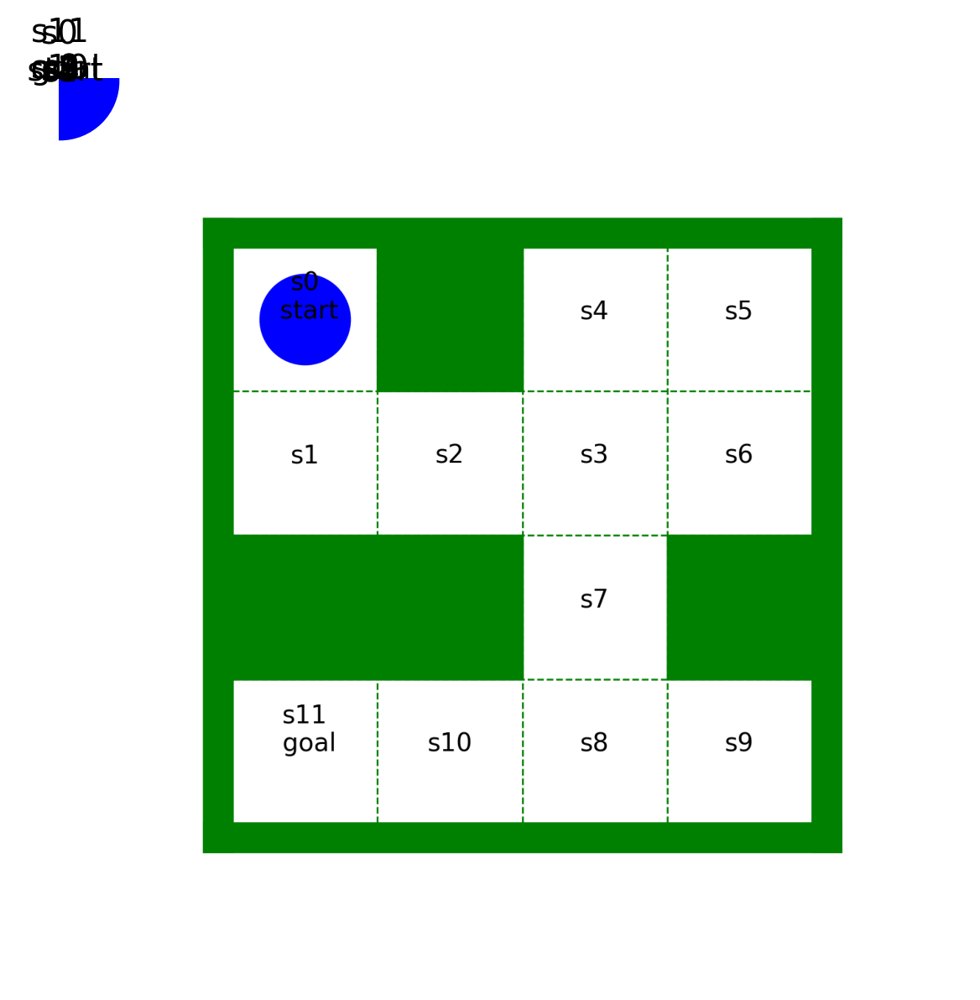

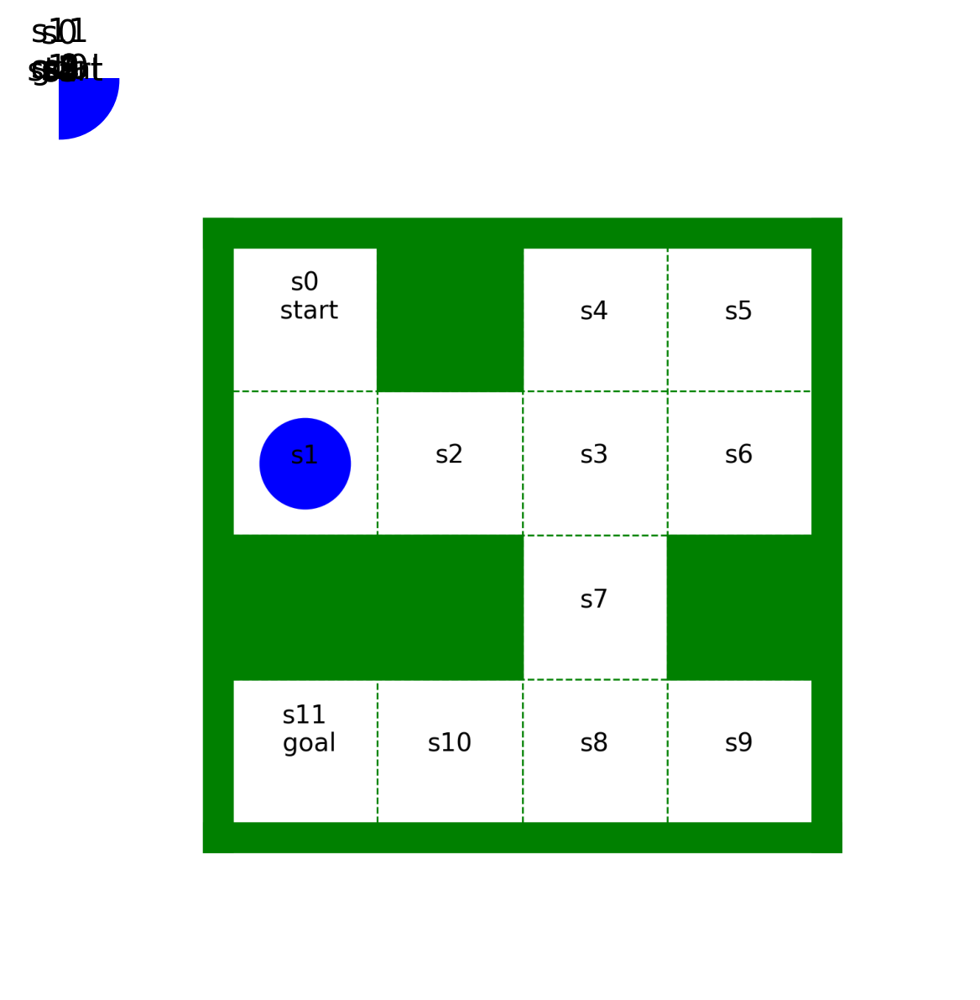

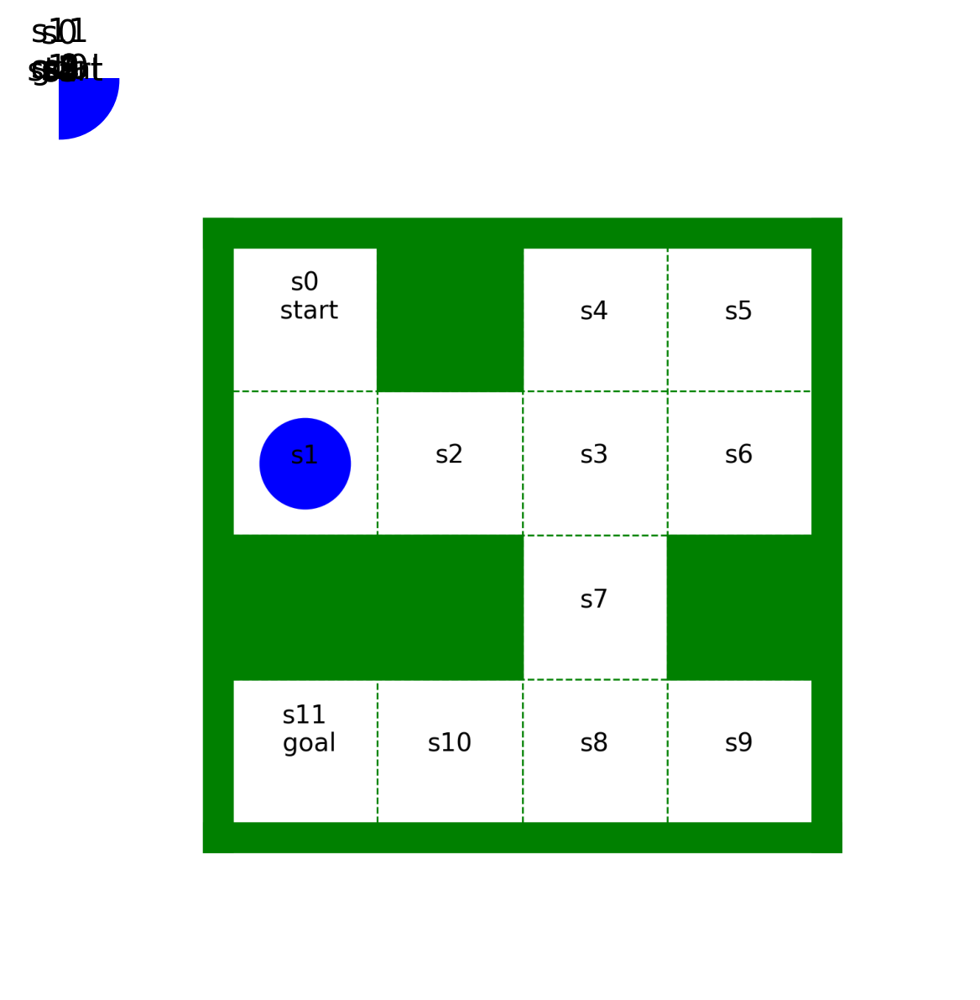

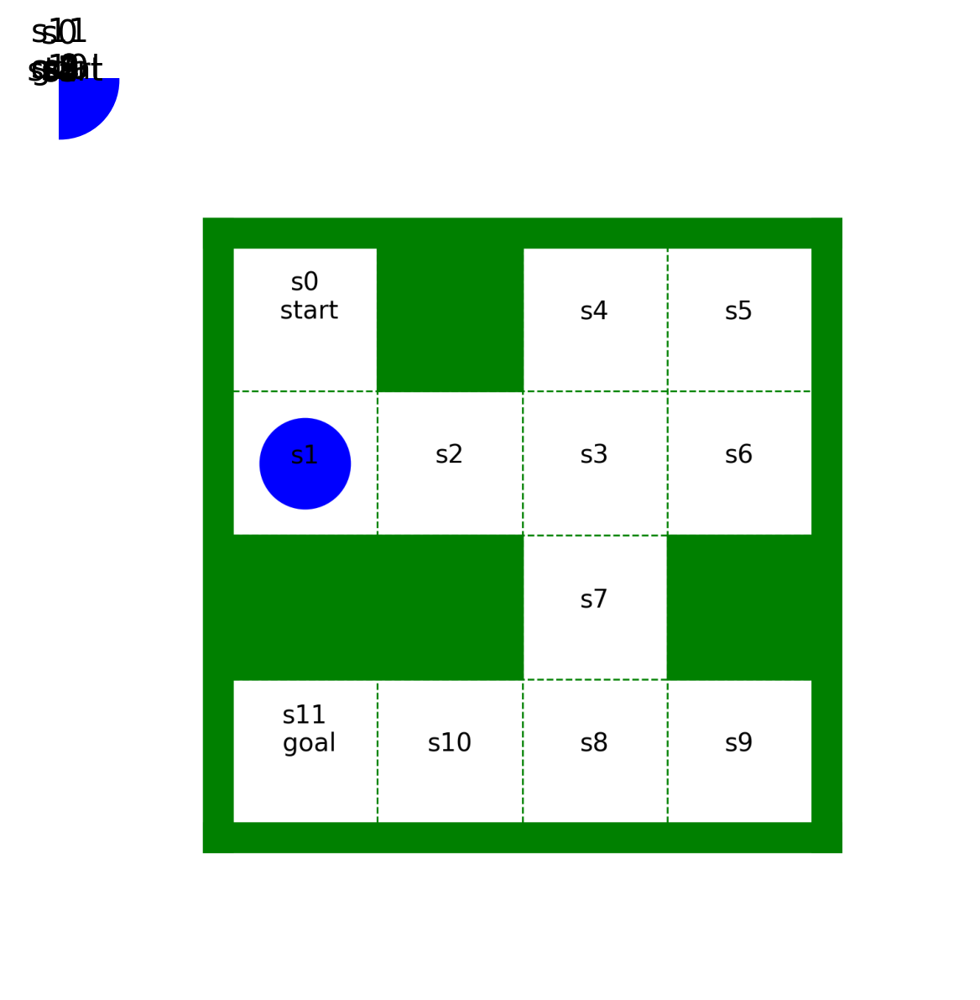

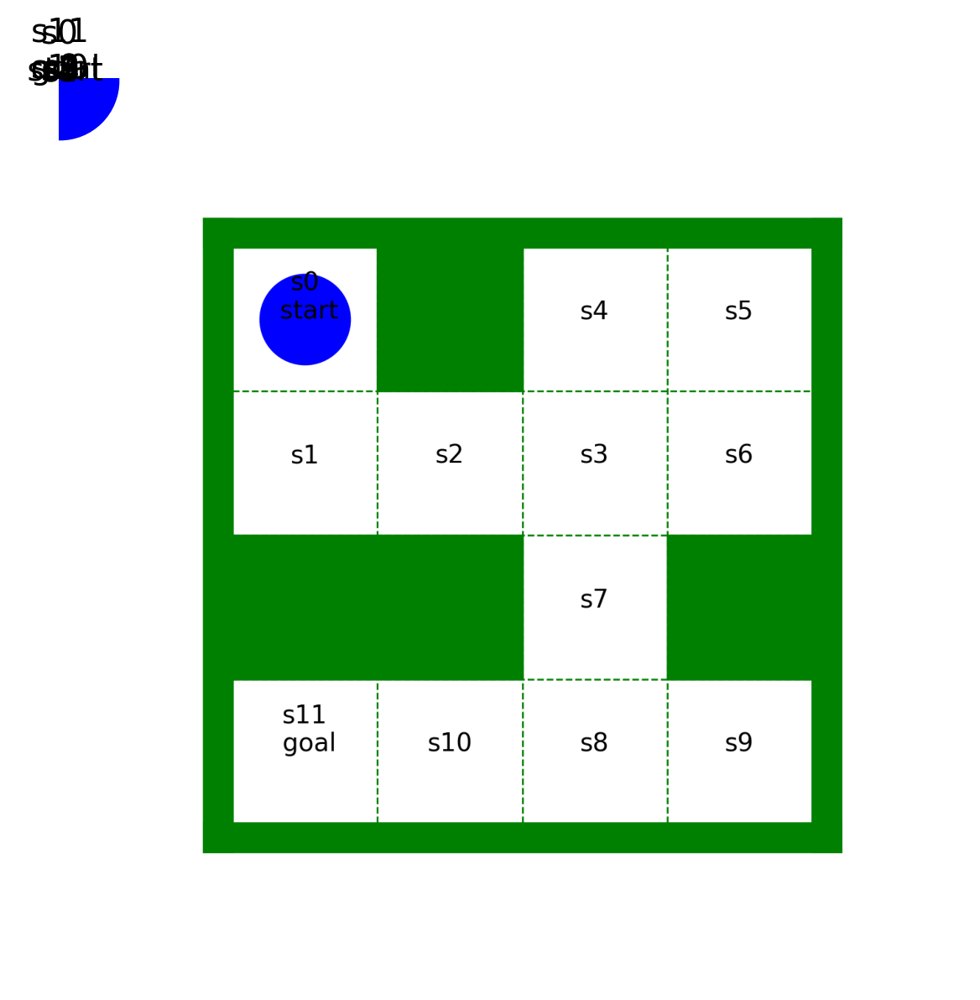

...

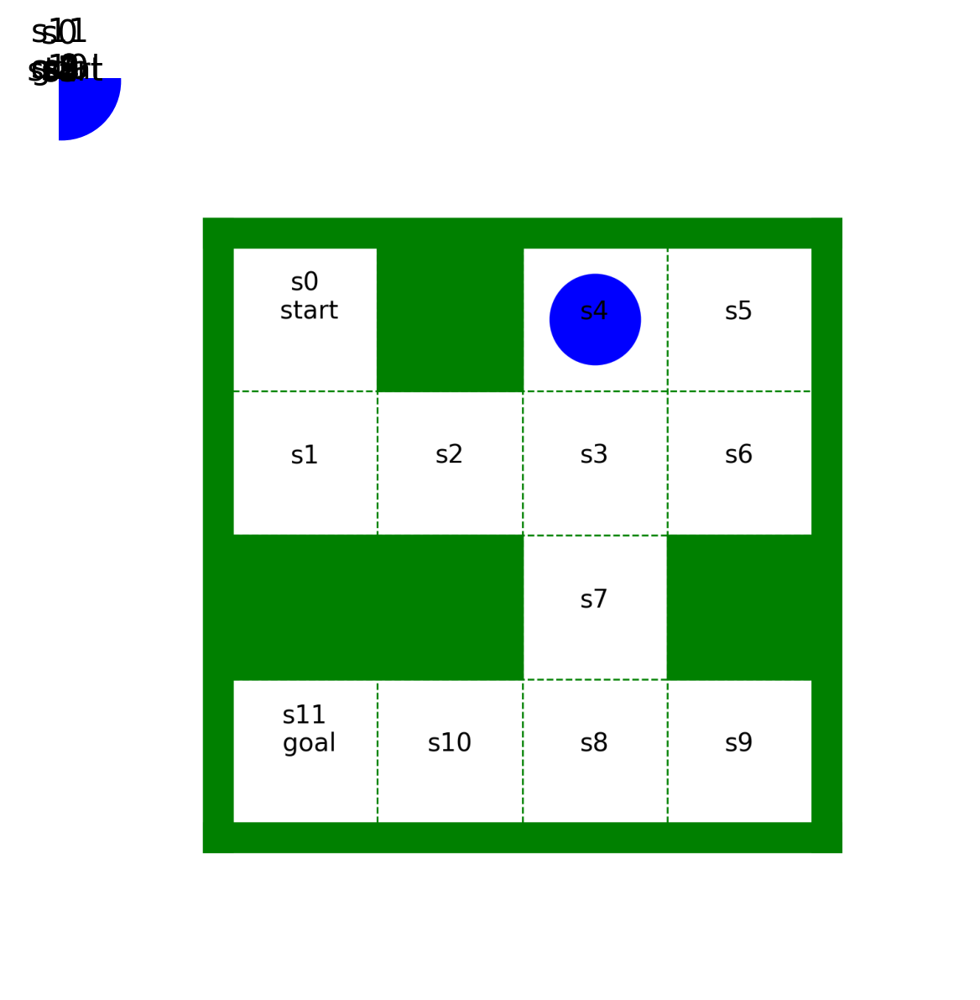

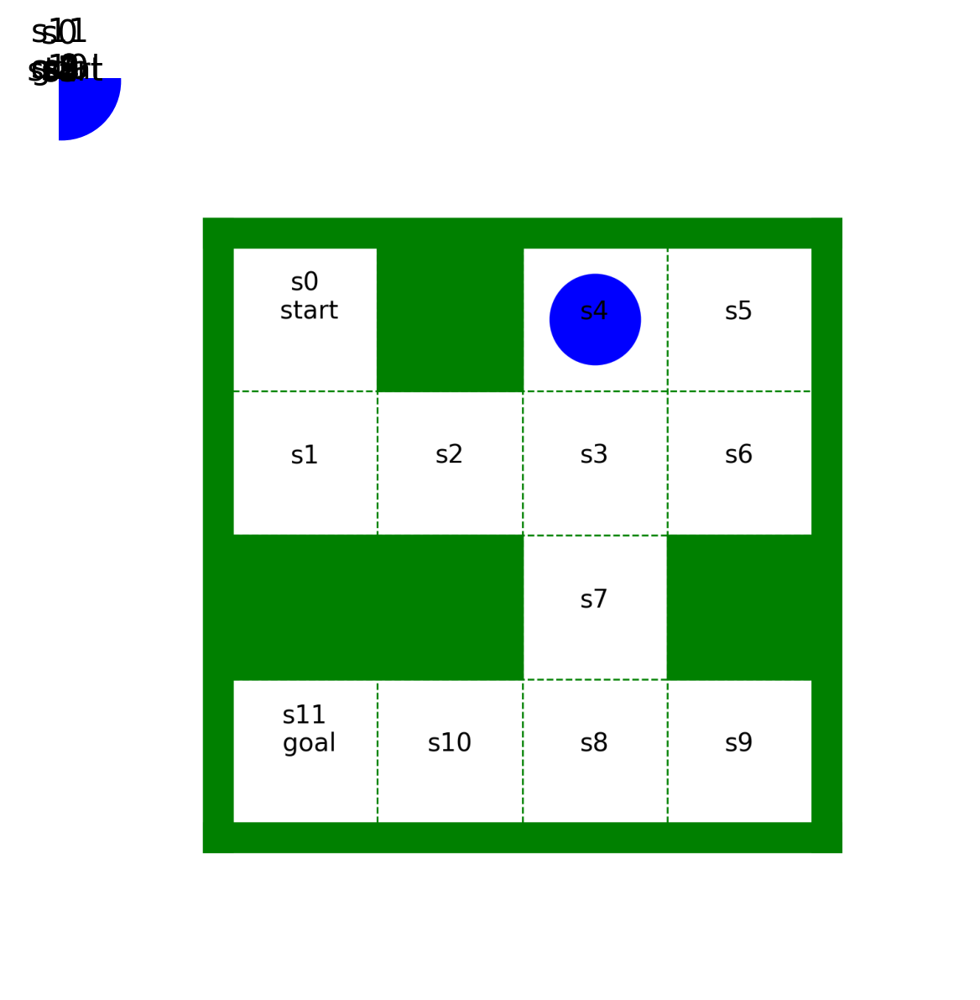

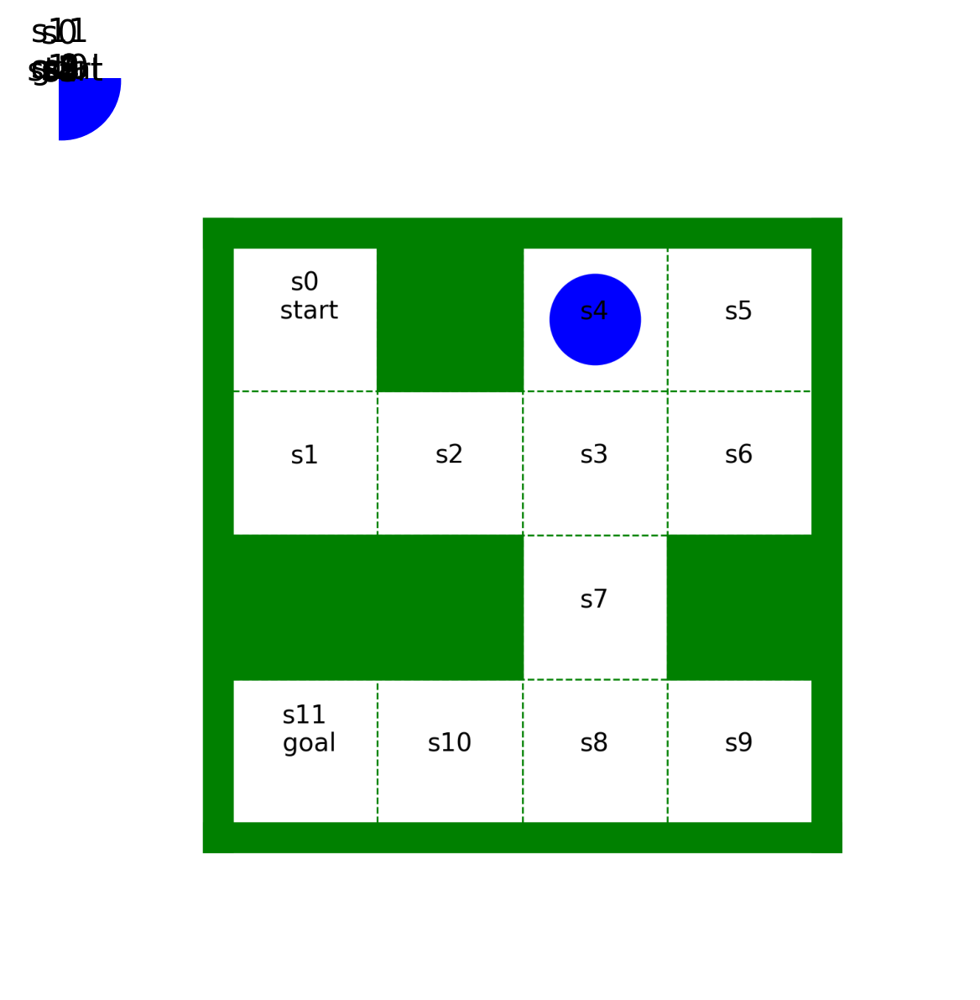

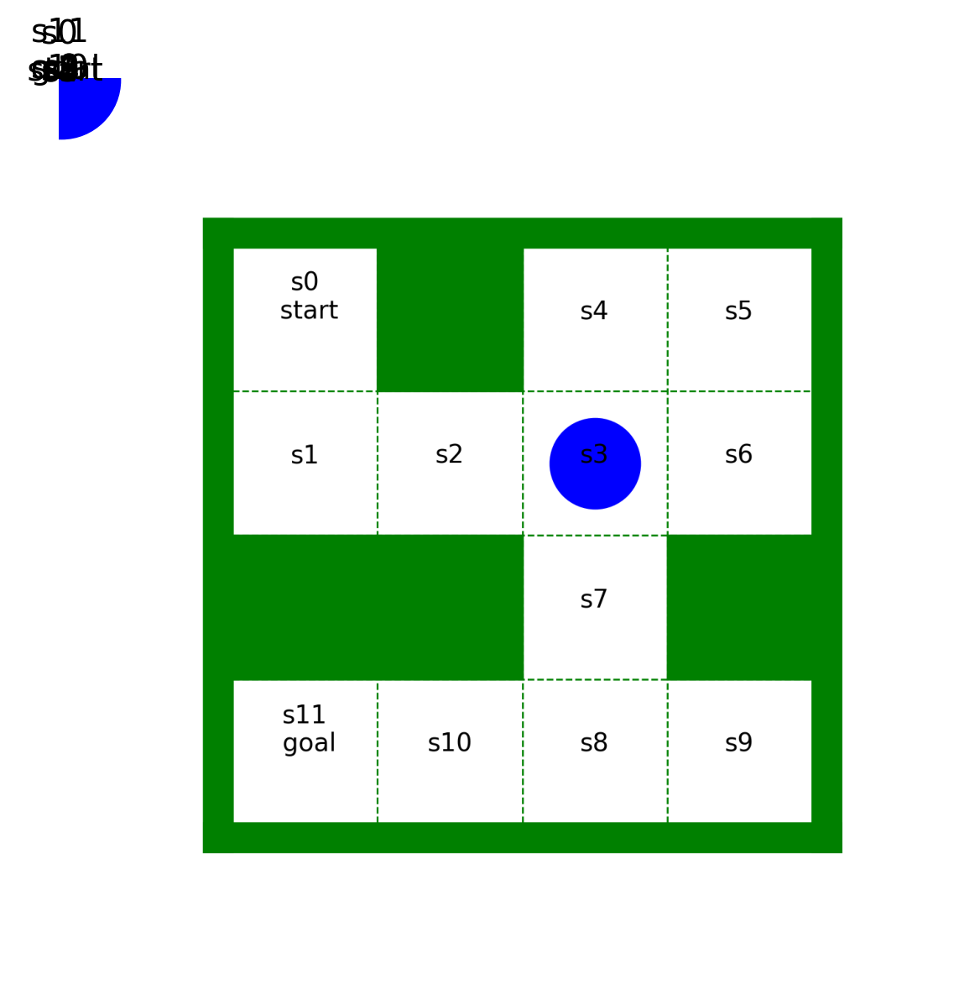

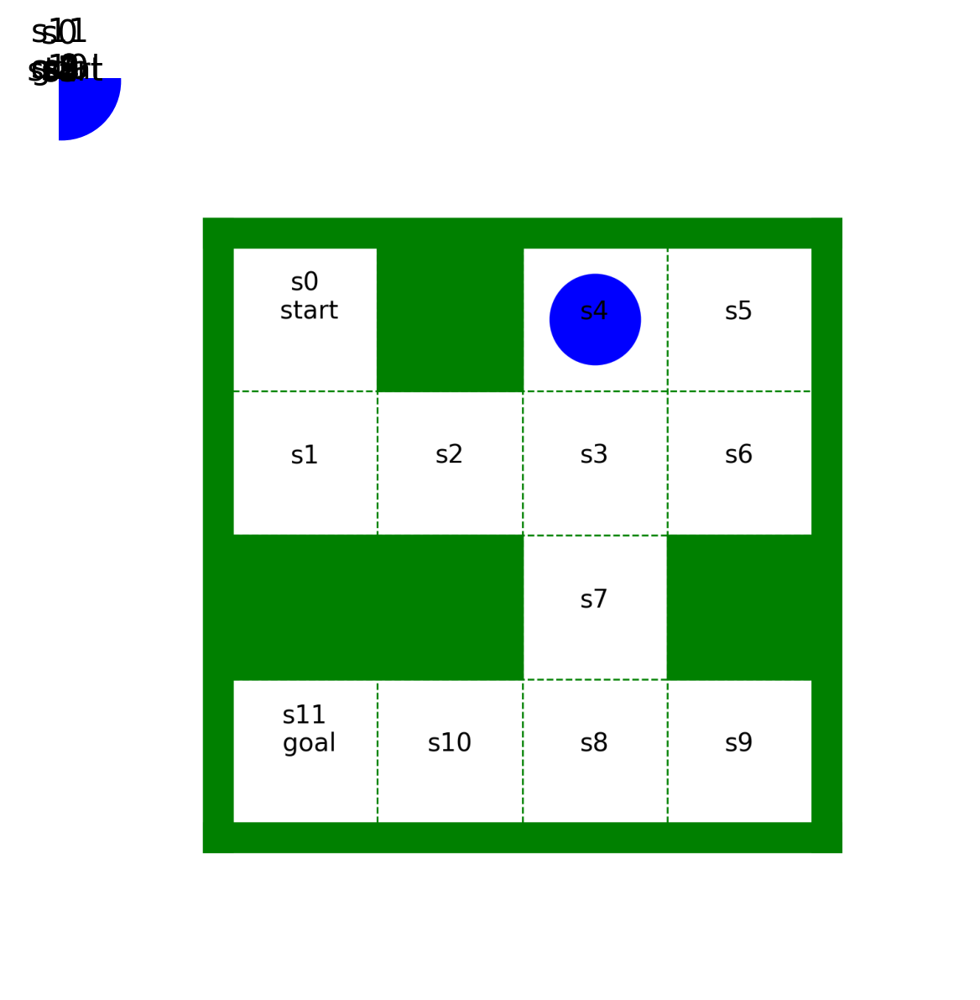

In [2]:
# EasyMaze環境の可視化
from IPython.display import display, clear_output
import time

env = EasyMaze()
obs = env.reset()

# 描画するフレーム数を制限
num_frames = 200

for _ in range(num_frames):
    action = env.action_space.sample()
    obs, re, done, info = env.step(action)
    
    img_array = env.render()
    plt.imshow(img_array)
    plt.axis('off')
    display(plt.gcf())
    clear_output(wait=True)
    time.sleep(0.01) # 0.5秒ごとに更新

    if done:
        env.reset()

# 最後のフレームを残すための描画
# plt.imshow(img_array)
# plt.axis('off')
# plt.show()
